In [1]:
#Import dependent modules
import matplotlib.pyplot as plt
import numpy as np
import os, sys, cv2
import random
import json
%matplotlib inline

In [2]:
#Load necessary data

#There are four kinds of label in CalTech Pedestrian data set
label_set = {'person', 'people', 'person-fa', 'person?'}  

#Load the ground truth annotation. You shold specify the file path of json ground truth
old_anno_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/annotations.json"
old_annotation = json.load(open(old_anno_path))

In [3]:
def get_frames(gt_annotation, box_filter=None):

    target_frames = []
    for set_num, set_annotation in gt_annotation.items():
        for v_num, v_annotation in set_annotation.items():
            for frame_num, boxes in v_annotation["frames"].items():
                filtered_box = [box for box in boxes if box_filter is None or box_filter(box)]
                
                #Only the the frames contain valid boxes are returned
                if len(filtered_box) > 0:
                    frame_name = "{}_{}_{}.jpg".format(set_num, v_num, frame_num)
                    target_frames.append((frame_name, filtered_box))
                      
    return target_frames
def get_boxes(gt_annotation, frame_name):
    set_num, v_num, frame_num = frame_name[:-4].split("_")
    if frame_num not in gt_annotation[set_num][v_num]["frames"].keys():
        return []
    return gt_annotation[set_num][v_num]["frames"][frame_num]

In [4]:
def cut_posv(posv_ori,pos_new):
    #rint 'posv_ori',posv_ori
    new_x = [pos_new[0],pos_new[0] + pos_new[2]]
    new_y = [pos_new[1],pos_new[1] + pos_new[3]]
    posv_x = [posv_ori[0],posv_ori[0] + posv_ori[2]]
    posv_y = [posv_ori[1],posv_ori[1] + posv_ori[3]]
    posv_wh = [pos_new[2],0]
    if posv_y[0] <= new_y[0] and posv_y[1] <= new_y[0]:
        posv_wh[1] = 0
    elif posv_y[0] <= new_y[0] and posv_y[1] >= new_y[0]:
        posv_wh[1] = posv_y[1] - new_y[0]
    elif posv_y[0] >= new_y[0] and posv_y[1] >= new_y[0]:
        posv_wh[1] = posv_ori[3]
    #print "after cut",posv_wh
    return posv_wh

In [5]:
def person_filter(box):
    return box['lbl'] == 'person'

#For boxes with a specified boundry, the default values arefrom 
def boundry_filter(box, bnds = {'xmin':5, 'ymin':5, 'xmax':635, 'ymax':475}):
    x1 = box['pos'][0]
    y1 = box['pos'][1]
    width = box['pos'][2]
    height = box['pos'][3]
    x2 = x1 + width
    y2 = y1 + height
    
    validity =  x1 >= bnds['xmin'] and \
                x2 <= bnds['xmax'] and \
                y1 >= bnds['ymin'] and \
                y2 <= bnds['ymax'] 
                
    return validity
    
#For boxes higher than a speifcied height
def height_filter(box, height_range = {'min':50, 'max': float('inf')}):
    height = box['pos'][3]
    validity = height >= height_range['min'] and \
               height < height_range['max']
    return validity

#For boxes more visible than a speifcied range
def visibility_filter(box, visible_range = {'min': 0.65, 'max': float('inf')}):
    occluded = box['occl']
    
    #A dirty condition to deal with the ill-formatted data.
    if occluded == 0 or \
       not hasattr(box['posv'], '__iter__') or \
       all([v==0 for v in box['posv']]):
           
        visiable_ratio = 1
    
    else:
        width = box['pos'][2]
        height = box['pos'][3]
        area = width * height   
           
        visible_width = box['posv'][2]
        visible_height = box['posv'][3]
        visible_area = visible_width * visible_height
           
        visiable_ratio = visible_area / area
        
        upper_part_pos = [box['pos'][0],box['pos'][1] + box['pos'][3]*0.7,box['pos'][2],box['pos'][3]*0.3]
        upper_posv_wh = cut_posv(box['posv'],upper_part_pos)
        upper_overlap = (upper_posv_wh[0] * upper_posv_wh[1]) / (upper_part_pos[2] * upper_part_pos[3])
           
           
           
    validity = (visiable_ratio  >= visible_range['min'] and \
           visiable_ratio  <= visible_range['max']) or\
        upper_overlap >= 0.65
           
    return validity

    

            

def reasonable_filter(box):
    validity = person_filter(box) and\
               boundry_filter(box) and\
               height_filter(box) and \
               visibility_filter(box)
           
    return validity


In [6]:
reasonable_frames = get_frames(old_annotation, reasonable_filter)
print("There are {} reasonable frames".format(len(reasonable_frames)))

There are 52273 reasonable frames


In [7]:
#A function that renders the image with bounding boxes
def render_frame(frame_name, boxes):
    #You probably need to change the file path.
    images_path = "/root/data/data/caltech-pedestrian-dataset-converter/data/images"
    
    frame_path = os.path.join(images_path, frame_name)
    im = cv2.imread(frame_path)[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')
    
    label_to_color = {"people": "red", "person": "green", "person-fa": "blue", "person?": "yellow","ignore" : "orange"}
    
  
    for box in boxes:
        x1 = box['pos'][0]
        y1 = box['pos'][1]
        width = box['pos'][2]
        length = box['pos'][3]
        label = box['lbl']
        color = label_to_color[label]
        #color = "red"
        rectangle = plt.Rectangle((x1,y1), width,length, fill=False, edgecolor=color, linewidth=1.5)
        ax.add_patch(rectangle)
        rectangle = plt.Rectangle((box['posv'][0],box['posv'][1]), box['posv'][2],box['posv'][3], fill=False, edgecolor="yellow", linewidth=1.0)
        ax.add_patch(rectangle)

        ax.text(x1, y1 - 2, label,
                bbox=dict(facecolor=color, alpha=0.5),
                fontsize=14, color='white')
    frame_name = frame_name + "_old"
        
        
            
    
    ax.set_title(frame_name)  
    plt.axis('off')
    plt.tight_layout()
    plt.draw()

In [8]:
#Apply the specified box_filter and verify it by rendering N images with the filtered bounding boxes
#A comparing filter can also be applied. The boxes from the comparing filter are dotted lines.
def verify_annotations(N,old_anno,box_filter):
    old_frames = get_frames(old_anno,reasonable_filter)
    #print("There are {} new frames".format(len(new_frames)))    
    old_bbox_count = 0
    for _, bboxes in old_frames:
        old_bbox_count += len(bboxes)
        
    
    
    print("Old:{} frames and {} bbox".format(len(old_frames), old_bbox_count))
    sampled_indices =  random.sample(range(len(old_frames)) ,N)

    #Render the selected images
    for sampled_index in sampled_indices :
        #print "sampled index",sampled_index
        frame_name, boxes = old_frames[sampled_index]
        
        #compare_boxes = get_boxes(old_anno,frame_name)
        #print compare_boxes
        #print boxes
        render_frame(frame_name, boxes)


Old:52273 frames and 95997 bbox


TypeError: 'int' object has no attribute '__getitem__'

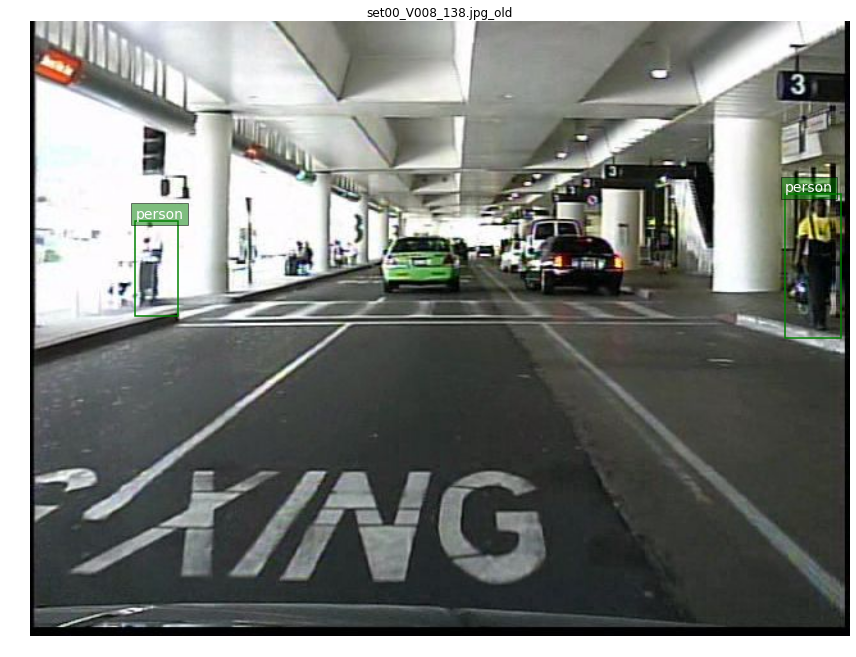

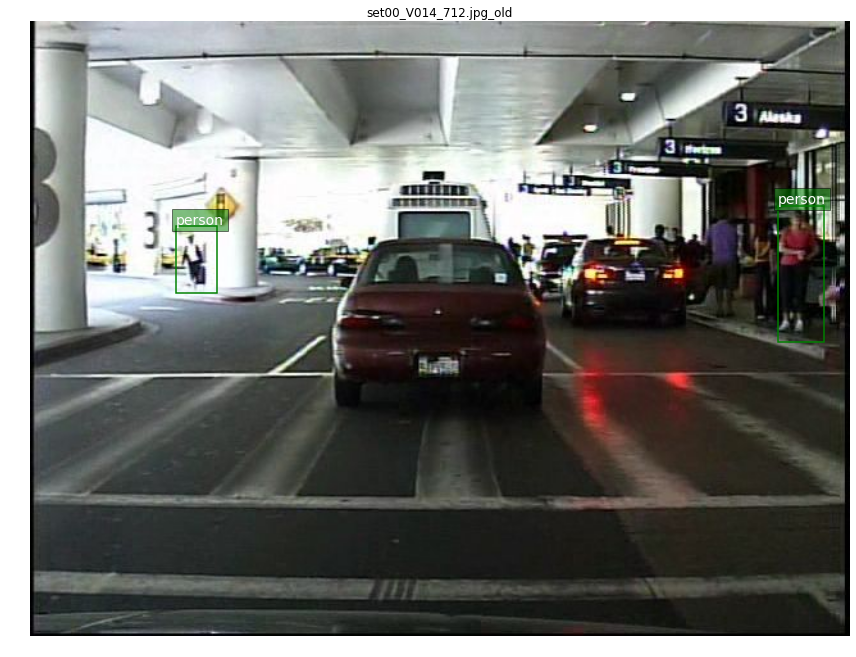

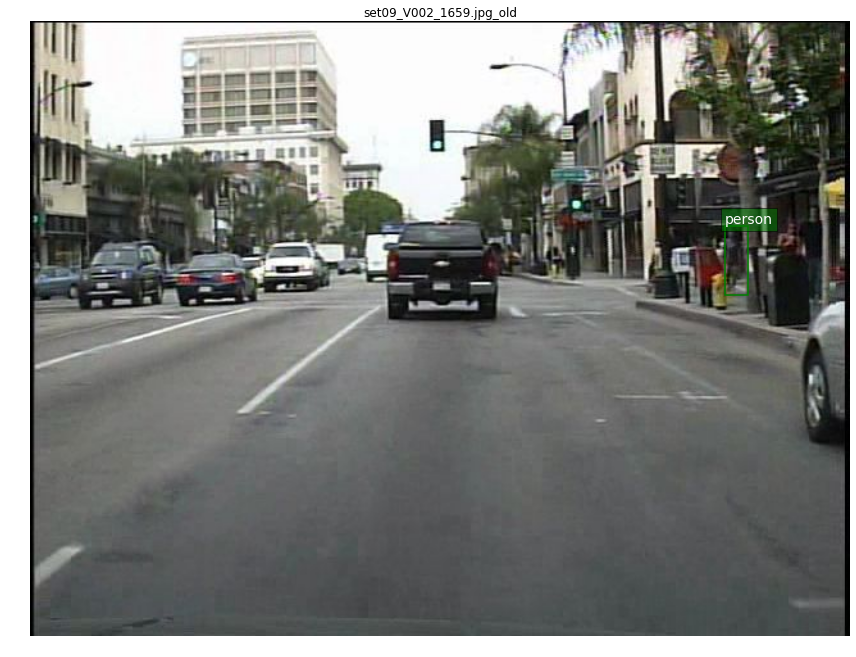

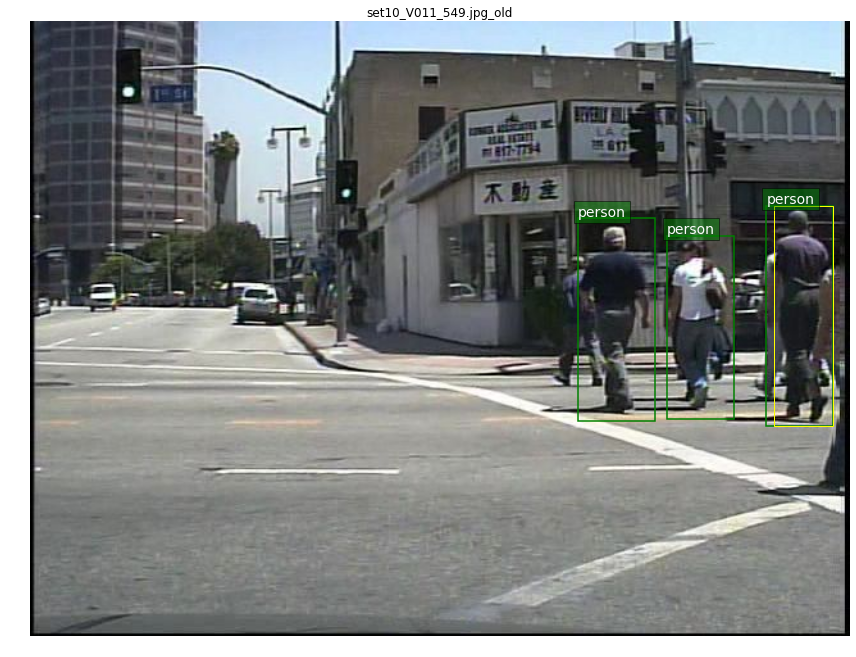

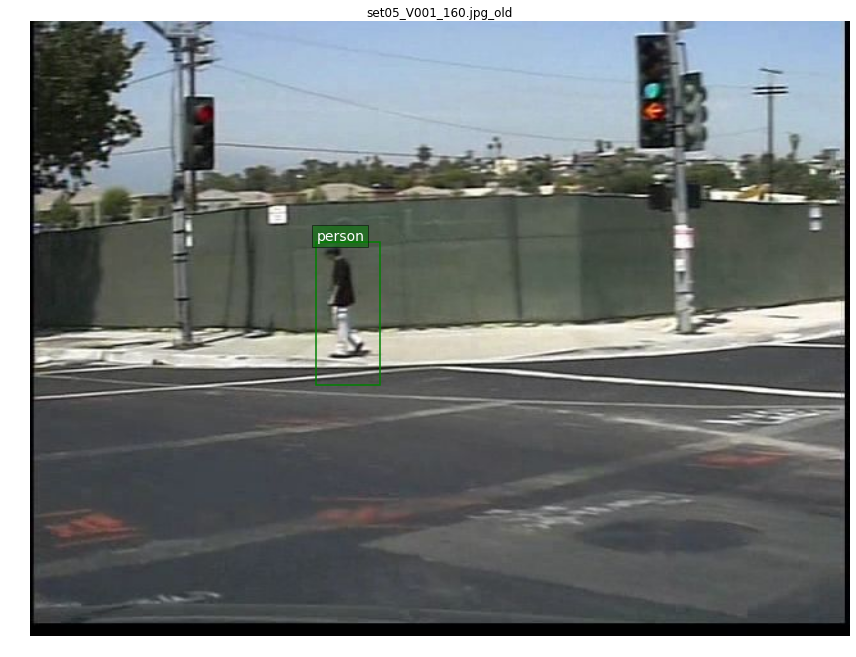

...

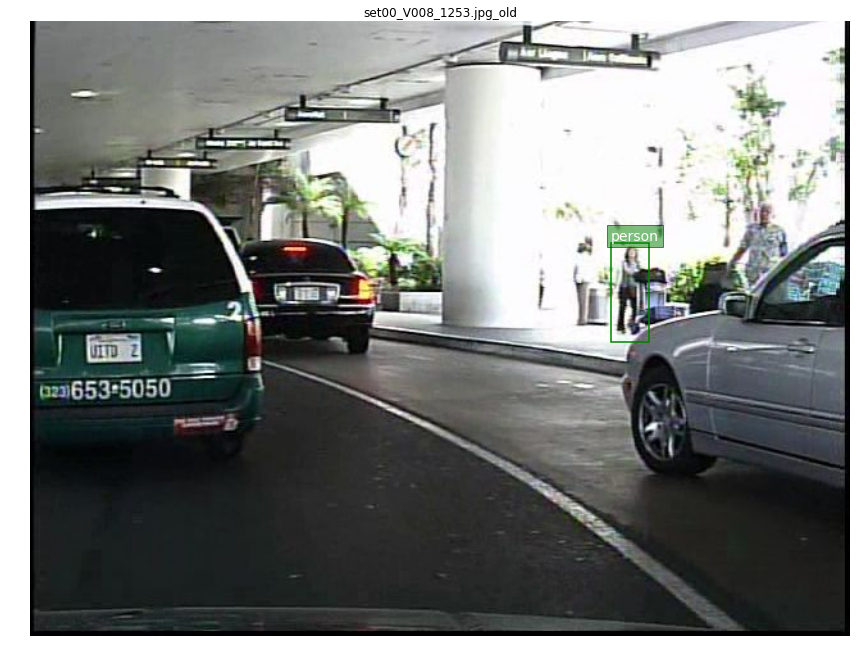

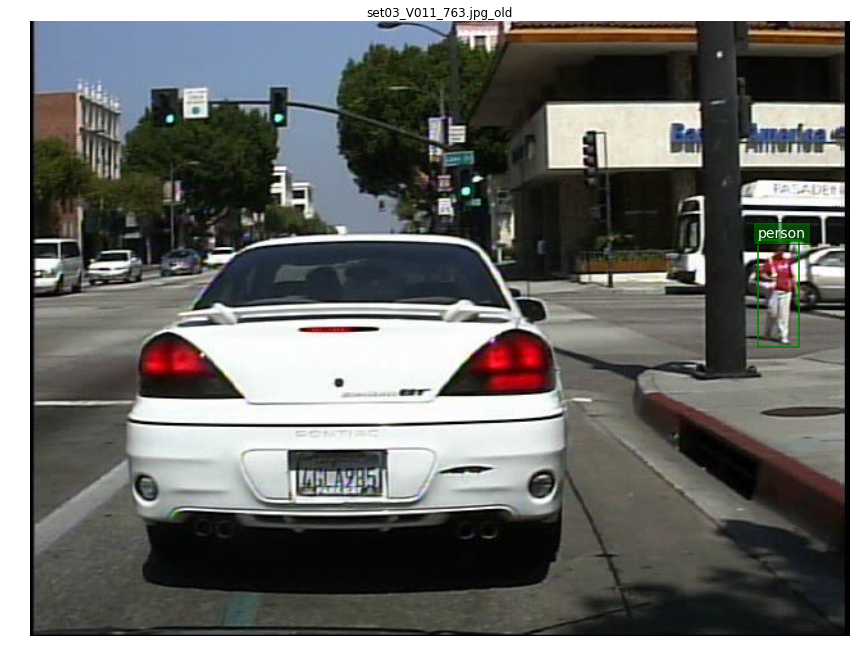

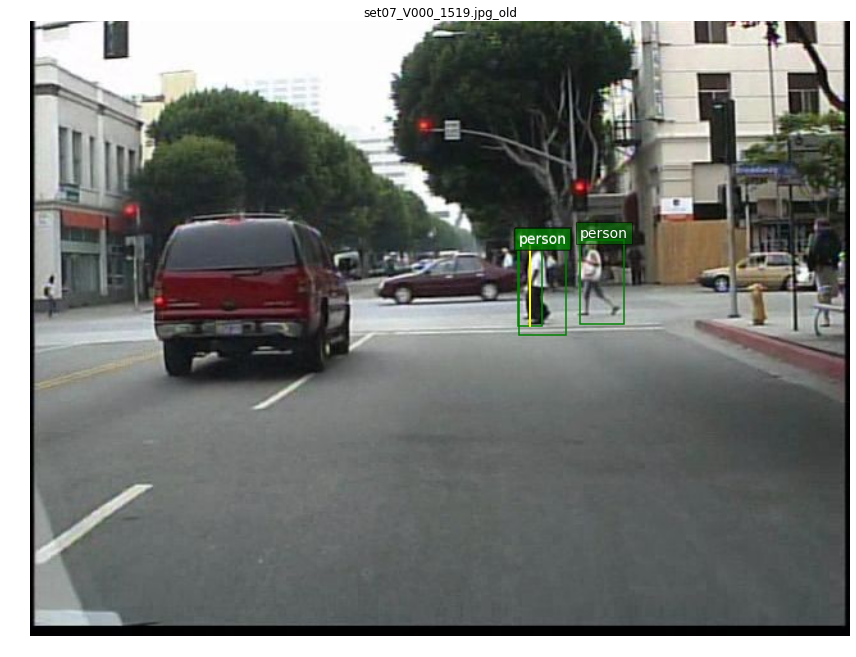

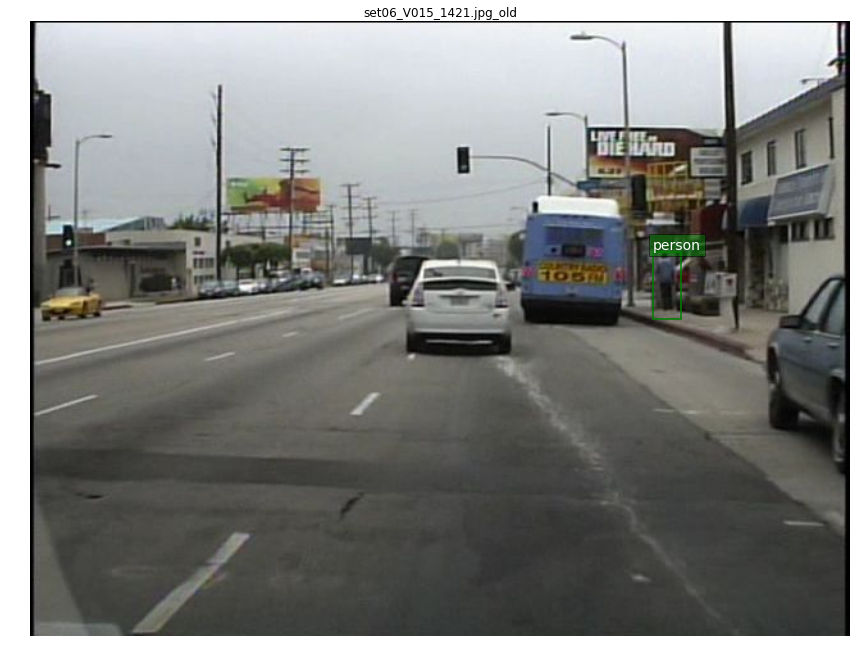

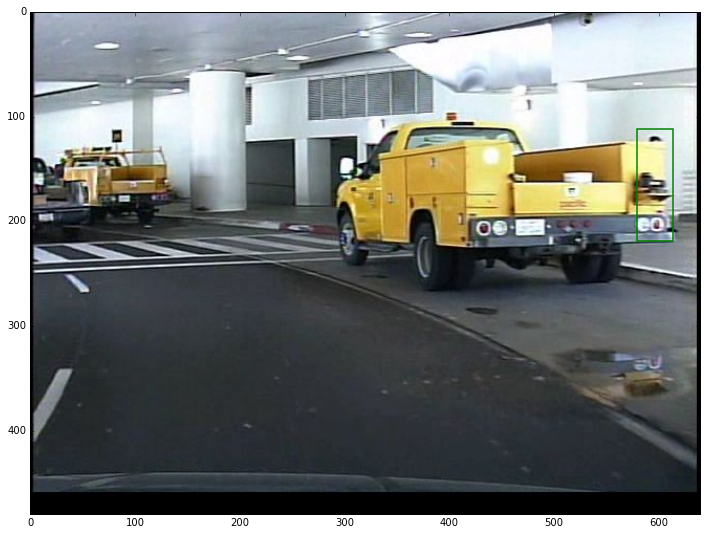

In [9]:
verify_annotations(30,old_annotation,reasonable_filter)